In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

In [2]:
train = pd.read_csv('C:/Users/Guillermo/Desktop/Curs Data Scientist/Hackaton BCN activa/train.csv')
test = pd.read_csv('C:/Users/Guillermo/Desktop/Curs Data Scientist/Hackaton BCN activa/test.csv')
train.head(10)

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,0,10.710,20.39,69.50,344.9,0.10820,0.12890,0.08448,0.028670,0.1668,...,11.690,25.21,76.51,410.4,0.1335,0.2550,0.25340,0.08600,0.2605,0.08701
1,0,13.640,16.34,87.21,571.8,0.07685,0.06059,0.01857,0.017230,0.1353,...,14.670,23.19,96.08,656.7,0.1089,0.1582,0.10500,0.08586,0.2346,0.08025
2,0,11.710,17.19,74.68,420.3,0.09774,0.06141,0.03809,0.032390,0.1516,...,13.010,21.39,84.42,521.5,0.1323,0.1040,0.15210,0.10990,0.2572,0.07097
3,1,15.300,25.27,102.40,732.4,0.10820,0.16970,0.16830,0.087510,0.1926,...,20.270,36.71,149.30,1269.0,0.1641,0.6110,0.63350,0.20240,0.4027,0.09876
4,1,14.450,20.22,94.49,642.7,0.09872,0.12060,0.11800,0.059800,0.1950,...,18.330,30.12,117.90,1044.0,0.1552,0.4056,0.49670,0.18380,0.4753,0.10130
5,0,14.030,21.25,89.79,603.4,0.09070,0.06945,0.01462,0.018960,0.1517,...,15.330,30.28,98.27,715.5,0.1287,0.1513,0.06231,0.07963,0.2226,0.07617
6,1,18.310,20.58,120.80,1052.0,0.10680,0.12480,0.15690,0.094510,0.1860,...,21.860,26.20,142.20,1493.0,0.1492,0.2536,0.37590,0.15100,0.3074,0.07863
7,0,13.850,17.21,88.44,588.7,0.08785,0.06136,0.01420,0.011410,0.1614,...,15.490,23.58,100.30,725.9,0.1157,0.1350,0.08115,0.05104,0.2364,0.07182
8,0,11.640,18.33,75.17,412.5,0.11420,0.10170,0.07070,0.034850,0.1801,...,13.140,29.26,85.51,521.7,0.1688,0.2660,0.28730,0.12180,0.2806,0.09097
9,0,8.196,16.84,51.71,201.9,0.08600,0.05943,0.01588,0.005917,0.1769,...,8.964,21.96,57.26,242.2,0.1297,0.1357,0.06880,0.02564,0.3105,0.07409


In [5]:
print('test', test.shape, '\ntrain', train.shape)

test (114, 30) 
train (455, 31)


La variable que falta en test es prediction
No hay NAs

In [3]:
names = train.columns

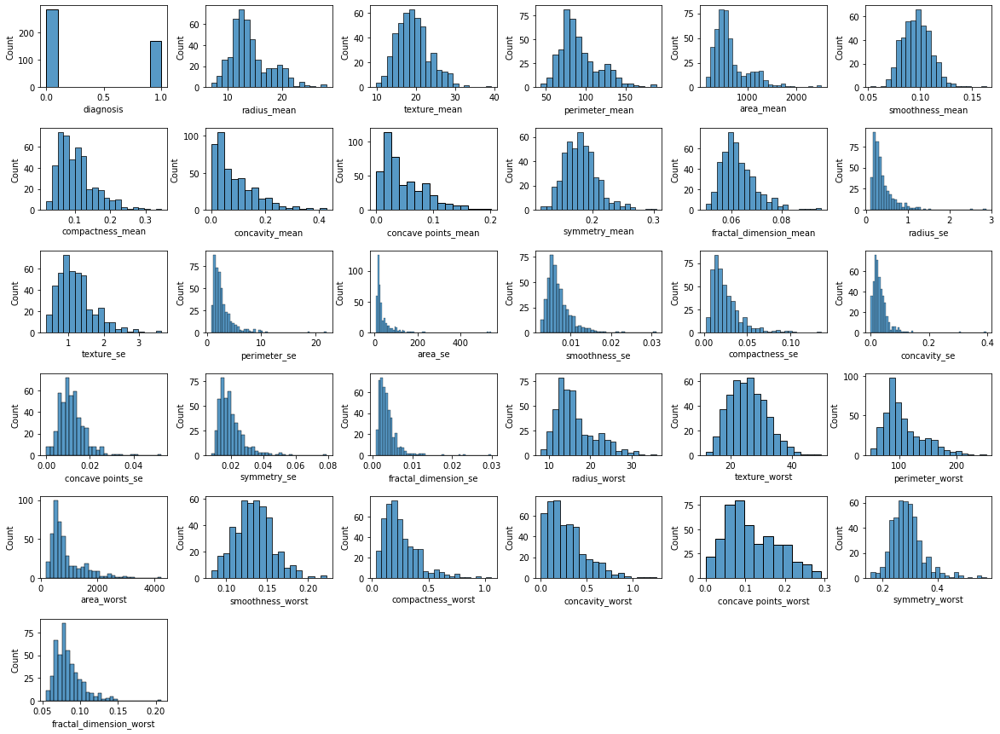

In [25]:
plt.figure(figsize = (20,15))
for i, name in enumerate(names):
    plt.subplot(6,6,i+1)
    sns.histplot(train[name])
    
plt.subplots_adjust(wspace=0.3,hspace=0.5)    
plt.show()

In [7]:
from scipy.stats import shapiro

for name in names:
    value = shapiro(train[name])
    if value[1]<0.05:
        result = 'No normal'
    else:
        result = 'normal'
    print(name, value, result)

diagnosis ShapiroResult(statistic=0.6128777265548706, pvalue=1.1499761552173489e-30) No normal
radius_mean ShapiroResult(statistic=0.937559187412262, pvalue=6.964599795315773e-13) No normal
texture_mean ShapiroResult(statistic=0.9742826223373413, pvalue=3.497317209166795e-07) No normal
perimeter_mean ShapiroResult(statistic=0.9326791167259216, pvalue=1.866924448151383e-13) No normal
area_mean ShapiroResult(statistic=0.8524515628814697, pvalue=3.0345014142756983e-20) No normal
smoothness_mean ShapiroResult(statistic=0.9867929220199585, pvalue=0.0003808085748460144) No normal
compactness_mean ShapiroResult(statistic=0.9159144163131714, pvalue=3.1666424141890952e-15) No normal
concavity_mean ShapiroResult(statistic=0.8654717206954956, pvalue=2.290324046418848e-19) No normal
concave points_mean ShapiroResult(statistic=0.8887335062026978, pvalue=1.2529875492963372e-17) No normal
symmetry_mean ShapiroResult(statistic=0.9708701968193054, pvalue=7.212966579572822e-08) No normal
fractal_dimensi

En la exploración gráfica se ve que los diferentes datasets presentan una forma no normal en su mayoría y además el rango de los valores para cada variable es muy diferente entre ellos. Además, ninguna de las columnas cumple la hipótesis nula en el shapiro test que los datos sigan una distribución noraml. Por lo tanto será necesario estandarizar o normalizar

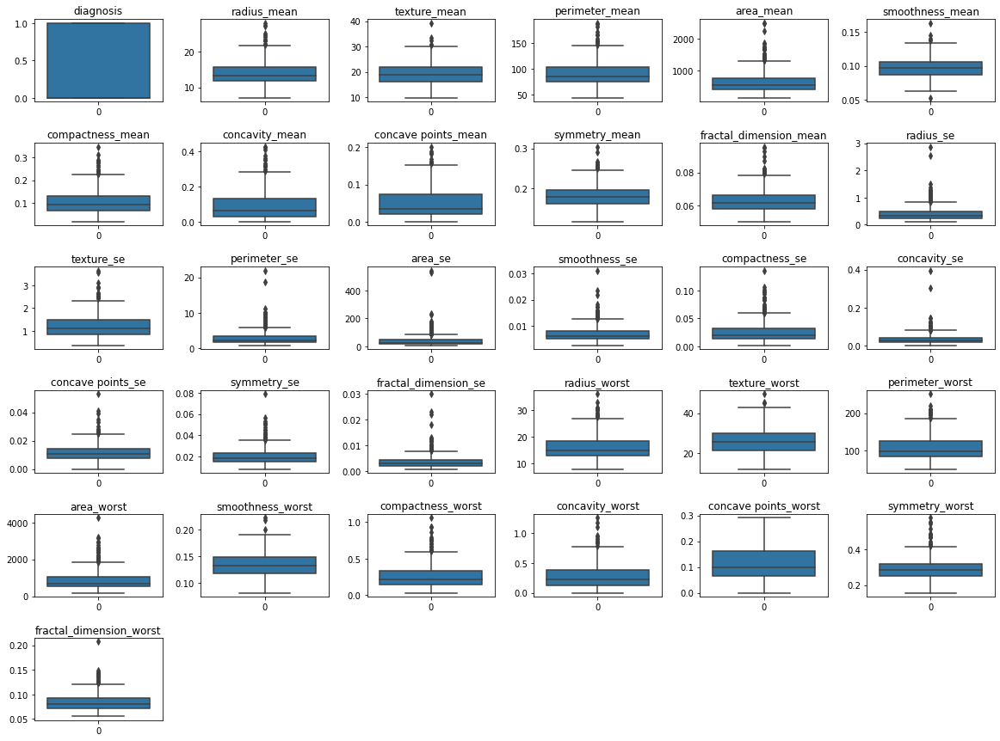

In [28]:
plt.figure(figsize = (20,15))
for i, name in enumerate(names):
    plt.subplot(6,6,i+1)
    sns.boxplot(data=train[name])
    plt.title(name)
    
plt.subplots_adjust(wspace=0.3,hspace=0.5)    
plt.show()

Además los datos presentan todos outliers y algunos de ellos son asimétricos

In [11]:
train.describe()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
count,455.000000,455.000000,455.000000,455.000000,455.000000,455.000000,455.000000,455.000000,455.000000,455.000000,...,455.000000,455.000000,455.000000,455.000000,455.000000,455.000000,455.000000,455.000000,455.000000,455.000000
mean,0.373626,14.139000,19.306286,92.086044,657.829890,0.096849,0.105557,0.090775,0.049585,0.181319,...,16.276679,25.823099,107.319516,882.553187,0.133482,0.256997,0.278242,0.115695,0.290325,0.084309
std,0.484299,3.625935,4.267421,24.998077,363.536865,0.013981,0.052932,0.080993,0.039159,0.027140,...,4.897917,6.123728,34.025815,574.721873,0.022902,0.157587,0.211802,0.065949,0.059696,0.018168
min,0.000000,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.116700,...,7.930000,12.020000,50.410000,185.200000,0.081250,0.034320,0.000000,0.000000,0.156500,0.055040
25%,0.000000,11.705000,16.210000,75.015000,419.250000,0.086740,0.066735,0.030180,0.020720,0.162050,...,12.980000,21.350000,84.290000,513.950000,0.118350,0.151650,0.119350,0.065080,0.251550,0.071835
50%,0.000000,13.300000,18.890000,85.980000,546.400000,0.096860,0.094860,0.063870,0.033840,0.179700,...,14.990000,25.440000,97.660000,688.600000,0.132600,0.215600,0.229900,0.099930,0.283300,0.080190
75%,1.000000,15.740000,21.795000,103.650000,777.250000,0.106050,0.130450,0.132200,0.074490,0.195800,...,18.550000,29.990000,124.950000,1047.000000,0.147950,0.333800,0.387200,0.161950,0.317500,0.092070
max,1.000000,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,...,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.577400,0.207500


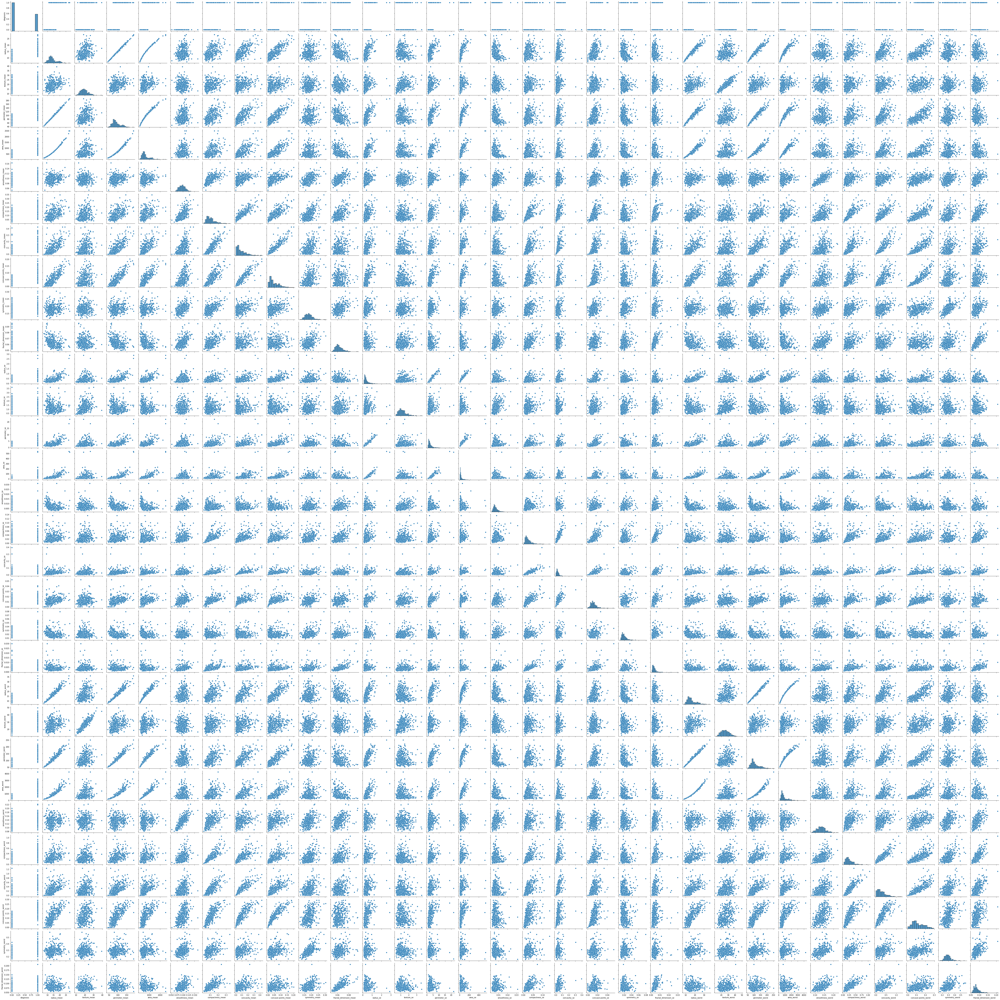

In [9]:
sns.pairplot(train)

### Correlación de Pearson

Realizamos una correlación para ver si hay algún dato que se explica directamente con otro. Como ninguna de las variables sigue una distribución normal lo recomendable será hacer una correlación no paramétrica como Sperman

In [4]:
sper_corr = train.corr(method = 'kendall')

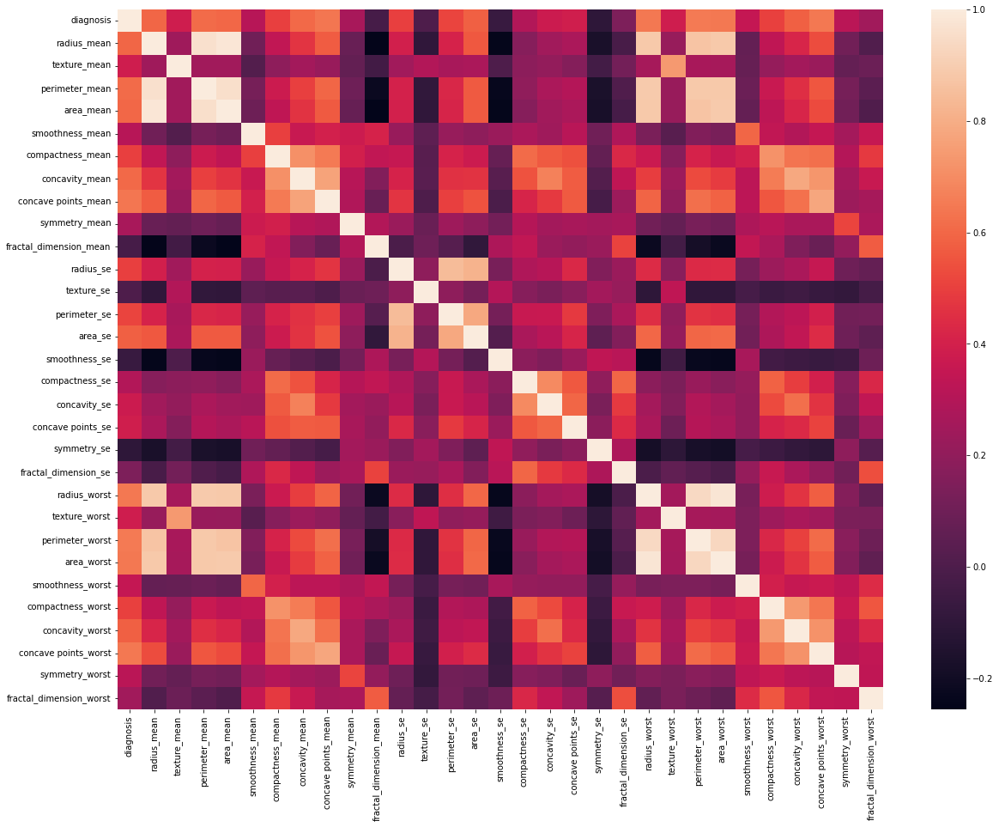

In [16]:
plt.figure(figsize = (20,15))
sns.heatmap(sper_corr)
plt.show()

<AxesSubplot:>

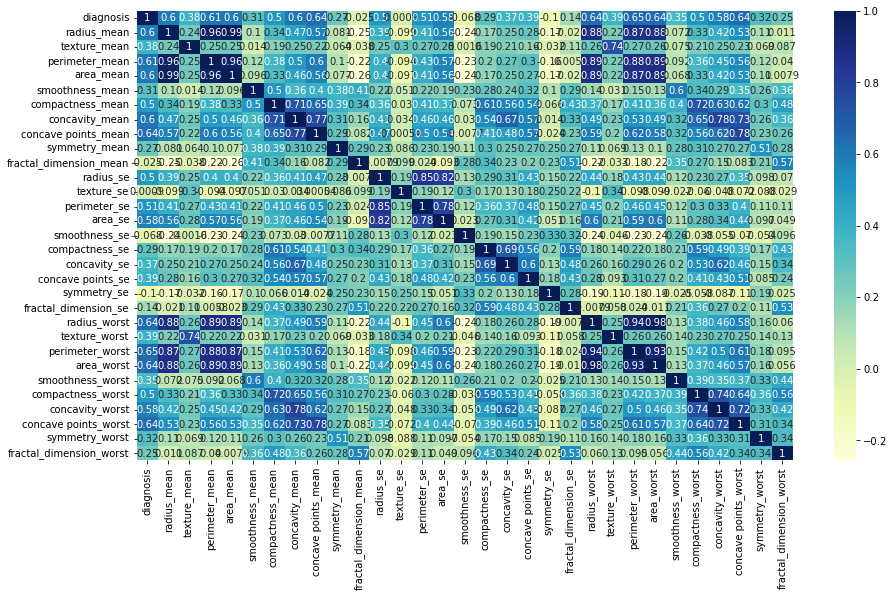

In [6]:
from pylab import rcParams
from scipy.stats.stats import kendalltau

rcParams['figure.figsize'] = 14.7,8.27
sns.heatmap(sper_corr, 
           xticklabels=sper_corr.columns.values, 
           yticklabels=sper_corr.columns.values, 
           cmap="YlGnBu",
          annot=True)

In [9]:
from scipy.stats import kendalltau as kd

for name in names:
    for name2 in names:
        corr, pvalue = kd(train[name], train[name2])
        if pvalue < 0.05:
            result = 'p-value < 0.05'
        else:
            result = ''
        print(name, ' VS ', name2, 'corr: ', round(corr,3), 'p-value: ', 
              round(pvalue,3), result)

diagnosis  VS  diagnosis corr:  1.0 p-value:  0.0 p-value < 0.05
diagnosis  VS  radius_mean corr:  0.596 p-value:  0.0 p-value < 0.05
diagnosis  VS  texture_mean corr:  0.384 p-value:  0.0 p-value < 0.05
diagnosis  VS  perimeter_mean corr:  0.609 p-value:  0.0 p-value < 0.05
diagnosis  VS  area_mean corr:  0.598 p-value:  0.0 p-value < 0.05
diagnosis  VS  smoothness_mean corr:  0.308 p-value:  0.0 p-value < 0.05
diagnosis  VS  compactness_mean corr:  0.496 p-value:  0.0 p-value < 0.05
diagnosis  VS  concavity_mean corr:  0.603 p-value:  0.0 p-value < 0.05
diagnosis  VS  concave points_mean corr:  0.637 p-value:  0.0 p-value < 0.05
diagnosis  VS  symmetry_mean corr:  0.268 p-value:  0.0 p-value < 0.05
diagnosis  VS  fractal_dimension_mean corr:  -0.025 p-value:  0.515 
diagnosis  VS  radius_se corr:  0.498 p-value:  0.0 p-value < 0.05
diagnosis  VS  texture_se corr:  0.001 p-value:  0.981 
diagnosis  VS  perimeter_se corr:  0.511 p-value:  0.0 p-value < 0.05
diagnosis  VS  area_se corr:

area_mean  VS  area_se corr:  0.564 p-value:  0.0 p-value < 0.05
area_mean  VS  smoothness_se corr:  -0.243 p-value:  0.0 p-value < 0.05
area_mean  VS  compactness_se corr:  0.167 p-value:  0.0 p-value < 0.05
area_mean  VS  concavity_se corr:  0.247 p-value:  0.0 p-value < 0.05
area_mean  VS  concave points_se corr:  0.274 p-value:  0.0 p-value < 0.05
area_mean  VS  symmetry_se corr:  -0.174 p-value:  0.0 p-value < 0.05
area_mean  VS  fractal_dimension_se corr:  -0.023 p-value:  0.469 
area_mean  VS  radius_worst corr:  0.887 p-value:  0.0 p-value < 0.05
area_mean  VS  texture_worst corr:  0.218 p-value:  0.0 p-value < 0.05
area_mean  VS  perimeter_worst corr:  0.869 p-value:  0.0 p-value < 0.05
area_mean  VS  area_worst corr:  0.888 p-value:  0.0 p-value < 0.05
area_mean  VS  smoothness_worst corr:  0.068 p-value:  0.03 p-value < 0.05
area_mean  VS  compactness_worst corr:  0.329 p-value:  0.0 p-value < 0.05
area_mean  VS  concavity_worst corr:  0.419 p-value:  0.0 p-value < 0.05
area

concave points_mean  VS  concave points_mean corr:  1.0 p-value:  0.0 p-value < 0.05
concave points_mean  VS  symmetry_mean corr:  0.289 p-value:  0.0 p-value < 0.05
concave points_mean  VS  fractal_dimension_mean corr:  0.082 p-value:  0.009 p-value < 0.05
concave points_mean  VS  radius_se corr:  0.465 p-value:  0.0 p-value < 0.05
concave points_mean  VS  texture_se corr:  0.001 p-value:  0.986 
concave points_mean  VS  perimeter_se corr:  0.497 p-value:  0.0 p-value < 0.05
concave points_mean  VS  area_se corr:  0.545 p-value:  0.0 p-value < 0.05
concave points_mean  VS  smoothness_se corr:  -0.008 p-value:  0.807 
concave points_mean  VS  compactness_se corr:  0.411 p-value:  0.0 p-value < 0.05
concave points_mean  VS  concavity_se corr:  0.483 p-value:  0.0 p-value < 0.05
concave points_mean  VS  concave points_se corr:  0.568 p-value:  0.0 p-value < 0.05
concave points_mean  VS  symmetry_se corr:  -0.024 p-value:  0.442 
concave points_mean  VS  fractal_dimension_se corr:  0.234 

texture_se  VS  perimeter_se corr:  0.191 p-value:  0.0 p-value < 0.05
texture_se  VS  area_se corr:  0.12 p-value:  0.0 p-value < 0.05
texture_se  VS  smoothness_se corr:  0.301 p-value:  0.0 p-value < 0.05
texture_se  VS  compactness_se corr:  0.169 p-value:  0.0 p-value < 0.05
texture_se  VS  concavity_se corr:  0.133 p-value:  0.0 p-value < 0.05
texture_se  VS  concave points_se corr:  0.176 p-value:  0.0 p-value < 0.05
texture_se  VS  symmetry_se corr:  0.25 p-value:  0.0 p-value < 0.05
texture_se  VS  fractal_dimension_se corr:  0.219 p-value:  0.0 p-value < 0.05
texture_se  VS  radius_worst corr:  -0.101 p-value:  0.001 p-value < 0.05
texture_se  VS  texture_worst corr:  0.337 p-value:  0.0 p-value < 0.05
texture_se  VS  perimeter_worst corr:  -0.098 p-value:  0.002 p-value < 0.05
texture_se  VS  area_worst corr:  -0.099 p-value:  0.002 p-value < 0.05
texture_se  VS  smoothness_worst corr:  -0.022 p-value:  0.476 
texture_se  VS  compactness_worst corr:  -0.06 p-value:  0.055 
t

compactness_se  VS  concave points_se corr:  0.563 p-value:  0.0 p-value < 0.05
compactness_se  VS  symmetry_se corr:  0.196 p-value:  0.0 p-value < 0.05
compactness_se  VS  fractal_dimension_se corr:  0.594 p-value:  0.0 p-value < 0.05
compactness_se  VS  radius_worst corr:  0.181 p-value:  0.0 p-value < 0.05
compactness_se  VS  texture_worst corr:  0.14 p-value:  0.0 p-value < 0.05
compactness_se  VS  perimeter_worst corr:  0.221 p-value:  0.0 p-value < 0.05
compactness_se  VS  area_worst corr:  0.176 p-value:  0.0 p-value < 0.05
compactness_se  VS  smoothness_worst corr:  0.211 p-value:  0.0 p-value < 0.05
compactness_se  VS  compactness_worst corr:  0.586 p-value:  0.0 p-value < 0.05
compactness_se  VS  concavity_worst corr:  0.491 p-value:  0.0 p-value < 0.05
compactness_se  VS  concave points_worst corr:  0.393 p-value:  0.0 p-value < 0.05
compactness_se  VS  symmetry_worst corr:  0.17 p-value:  0.0 p-value < 0.05
compactness_se  VS  fractal_dimension_worst corr:  0.425 p-value: 

fractal_dimension_se  VS  concave points_worst corr:  0.202 p-value:  0.0 p-value < 0.05
fractal_dimension_se  VS  symmetry_worst corr:  0.11 p-value:  0.0 p-value < 0.05
fractal_dimension_se  VS  fractal_dimension_worst corr:  0.534 p-value:  0.0 p-value < 0.05
radius_worst  VS  diagnosis corr:  0.644 p-value:  0.0 p-value < 0.05
radius_worst  VS  radius_mean corr:  0.885 p-value:  0.0 p-value < 0.05
radius_worst  VS  texture_mean corr:  0.26 p-value:  0.0 p-value < 0.05
radius_worst  VS  perimeter_mean corr:  0.888 p-value:  0.0 p-value < 0.05
radius_worst  VS  area_mean corr:  0.887 p-value:  0.0 p-value < 0.05
radius_worst  VS  smoothness_mean corr:  0.136 p-value:  0.0 p-value < 0.05
radius_worst  VS  compactness_mean corr:  0.367 p-value:  0.0 p-value < 0.05
radius_worst  VS  concavity_mean corr:  0.49 p-value:  0.0 p-value < 0.05
radius_worst  VS  concave points_mean corr:  0.589 p-value:  0.0 p-value < 0.05
radius_worst  VS  symmetry_mean corr:  0.11 p-value:  0.0 p-value < 0.0

smoothness_worst  VS  compactness_mean corr:  0.401 p-value:  0.0 p-value < 0.05
smoothness_worst  VS  concavity_mean corr:  0.324 p-value:  0.0 p-value < 0.05
smoothness_worst  VS  concave points_mean corr:  0.323 p-value:  0.0 p-value < 0.05
smoothness_worst  VS  symmetry_mean corr:  0.279 p-value:  0.0 p-value < 0.05
smoothness_worst  VS  fractal_dimension_mean corr:  0.346 p-value:  0.0 p-value < 0.05
smoothness_worst  VS  radius_se corr:  0.125 p-value:  0.0 p-value < 0.05
smoothness_worst  VS  texture_se corr:  -0.022 p-value:  0.476 
smoothness_worst  VS  perimeter_se corr:  0.123 p-value:  0.0 p-value < 0.05
smoothness_worst  VS  area_se corr:  0.112 p-value:  0.0 p-value < 0.05
smoothness_worst  VS  smoothness_se corr:  0.264 p-value:  0.0 p-value < 0.05
smoothness_worst  VS  compactness_se corr:  0.211 p-value:  0.0 p-value < 0.05
smoothness_worst  VS  concavity_se corr:  0.2 p-value:  0.0 p-value < 0.05
smoothness_worst  VS  concave points_se corr:  0.201 p-value:  0.0 p-val

symmetry_worst  VS  area_mean corr:  0.107 p-value:  0.001 p-value < 0.05
symmetry_worst  VS  smoothness_mean corr:  0.257 p-value:  0.0 p-value < 0.05
symmetry_worst  VS  compactness_mean corr:  0.3 p-value:  0.0 p-value < 0.05
symmetry_worst  VS  concavity_mean corr:  0.259 p-value:  0.0 p-value < 0.05
symmetry_worst  VS  concave points_mean corr:  0.233 p-value:  0.0 p-value < 0.05
symmetry_worst  VS  symmetry_mean corr:  0.511 p-value:  0.0 p-value < 0.05
symmetry_worst  VS  fractal_dimension_mean corr:  0.206 p-value:  0.0 p-value < 0.05
symmetry_worst  VS  radius_se corr:  0.098 p-value:  0.002 p-value < 0.05
symmetry_worst  VS  texture_se corr:  -0.088 p-value:  0.005 p-value < 0.05
symmetry_worst  VS  perimeter_se corr:  0.108 p-value:  0.001 p-value < 0.05
symmetry_worst  VS  area_se corr:  0.097 p-value:  0.002 p-value < 0.05
symmetry_worst  VS  smoothness_se corr:  -0.054 p-value:  0.084 
symmetry_worst  VS  compactness_se corr:  0.17 p-value:  0.0 p-value < 0.05
symmetry_wo

### Variables con baja correlación

* diagnosis  VS  fractal_dimension_mean corr:  -0.025 p-value:  0.515
* diagnosis  VS  texture_se corr:  0.001 p-value:  0.981 
* diagnosis  VS  smoothness_se corr:  -0.068 p-value:  0.075 
* radius_mean  VS  fractal_dimension_se corr:  -0.021 p-value:  0.512
* radius_mean  VS  fractal_dimension_worst corr:  0.011 p-value:  0.715 
* texture_mean  VS  smoothness_mean corr:  0.014 p-value:  0.66
* texture_mean  VS  fractal_dimension_mean corr:  -0.038 p-value:  0.23 
* texture_mean  VS  smoothness_se corr:  0.002 p-value:  0.96 
* texture_mean  VS  symmetry_se corr:  -0.032 p-value:  0.31 
* perimeter_mean  VS  fractal_dimension_se corr:  0.006 p-value:  0.854 
* perimeter_mean  VS  fractal_dimension_worst corr:  0.04 p-value:  0.203 
* area_mean  VS  fractal_dimension_se corr:  -0.023 p-value:  0.469 
* area_mean  VS  fractal_dimension_worst corr:  0.008 p-value:  0.8
* smoothness_mean  VS  texture_mean corr:  0.014 p-value:  0.66 
* smoothness_mean  VS  texture_se corr:  0.051 p-value:  0.102
* smoothness_mean  VS  texture_worst corr:  0.031 p-value:  0.322 
* compactness_mean  VS  texture_se corr:  0.03 p-value:  0.333 
* concavity_mean  VS  smoothness_se corr:  0.03 p-value:  0.34
* concavity_mean  VS  symmetry_se corr:  0.014 p-value:  0.651
* concave points_mean  VS  texture_se corr:  0.001 p-value:  0.986 
* concave points_mean  VS  smoothness_se corr:  -0.008 p-value:  0.807 
* concave points_mean  VS  symmetry_se corr:  -0.024 p-value:  0.442 
* fractal_dimension_mean  VS  diagnosis corr:  -0.025 p-value:  0.515
* fractal_dimension_mean  VS  texture_mean corr:  -0.038 p-value:  0.23 
* fractal_dimension_mean  VS  radius_se corr:  -0.008 p-value:  0.8 
* fractal_dimension_mean  VS  perimeter_se corr:  0.024 p-value:  0.45 
* fractal_dimension_mean  VS  texture_worst corr:  -0.033 p-value:  0.289 
* radius_se  VS  fractal_dimension_mean corr:  -0.008 p-value:  0.8 
* texture_se  VS  diagnosis corr:  0.001 p-value:  0.981 
* texture_se  VS  smoothness_mean corr:  0.051 p-value:  0.102 
* texture_se  VS  compactness_mean corr:  0.03 p-value:  0.333 
* texture_se  VS  concavity_mean corr:  0.034 p-value:  0.276 
* texture_se  VS  concave points_mean corr:  0.001 p-value:  0.986 
* texture_se  VS  smoothness_worst corr:  -0.022 p-value:  0.476 
* texture_se  VS  compactness_worst corr:  -0.06 p-value:  0.055 
* texture_se  VS  concavity_worst corr:  -0.048 p-value:  0.13 
* texture_se  VS  fractal_dimension_worst corr:  -0.029 p-value:  0.357
* perimeter_se  VS  fractal_dimension_mean corr:  0.024 p-value:  0.45 
* area_se  VS  smoothness_se corr:  0.023 p-value:  0.459 
* area_se  VS  symmetry_se corr:  0.051 p-value:  0.101 
* area_se  VS  fractal_dimension_worst corr:  0.049 p-value:  0.121 
* smoothness_se  VS  diagnosis corr:  -0.068 p-value:  0.075 
* smoothness_se  VS  texture_mean corr:  0.002 p-value:  0.96
* smoothness_se  VS  concavity_mean corr:  0.03 p-value:  0.34 
* smoothness_se  VS  concave points_mean corr:  -0.008 p-value:  0.807 
* smoothness_se  VS  area_se corr:  0.023 p-value:  0.459 
* smoothness_se  VS  texture_worst corr:  -0.046 p-value:  0.14 
* smoothness_se  VS  compactness_worst corr:  -0.038 p-value:  0.222 
* smoothness_se  VS  concavity_worst corr:  -0.055 p-value:  0.082 
* smoothness_se  VS  symmetry_worst corr:  -0.054 p-value:  0.084 
* symmetry_se  VS  texture_mean corr:  -0.032 p-value:  0.31 
* symmetry_se  VS  concavity_mean corr:  0.014 p-value:  0.651 
* symmetry_se  VS  concave points_mean corr:  -0.024 p-value:  0.442 
* symmetry_se  VS  area_se corr:  0.051 p-value:  0.101 
* symmetry_se  VS  smoothness_worst corr:  -0.025 p-value:  0.429 
* symmetry_se  VS  compactness_worst corr:  -0.058 p-value:  0.066 
* symmetry_se  VS  fractal_dimension_worst corr:  0.025 p-value:  0.429 
* fractal_dimension_se  VS  radius_mean corr:  -0.021 p-value:  0.512 
* fractal_dimension_se  VS  perimeter_mean corr:  0.006 p-value:  0.854 
* fractal_dimension_se  VS  area_mean corr:  -0.023 p-value:  0.469 
* fractal_dimension_se  VS  radius_worst corr:  -0.008 p-value:  0.801 
* fractal_dimension_se  VS  texture_worst corr:  0.058 p-value:  0.065 
* fractal_dimension_se  VS  perimeter_worst corr:  0.024 p-value:  0.443 
* fractal_dimension_se  VS  area_worst corr:  -0.011 p-value:  0.728 
* radius_worst  VS  fractal_dimension_se corr:  -0.008 p-value:  0.801 
* radius_worst  VS  fractal_dimension_worst corr:  0.06 p-value:  0.055 
* texture_worst  VS  smoothness_mean corr:  0.031 p-value:  0.322 
* texture_worst  VS  fractal_dimension_mean corr:  -0.033 p-value:  0.289
* texture_worst  VS  smoothness_se corr:  -0.046 p-value:  0.14 
* texture_worst  VS  fractal_dimension_se corr:  0.058 p-value:  0.065 
* perimeter_worst  VS  fractal_dimension_se corr:  0.024 p-value:  0.443
* area_worst  VS  fractal_dimension_worst corr:  0.056 p-value:  0.077 
* smoothness_worst  VS  texture_se corr:  -0.022 p-value:  0.476 
* smoothness_worst  VS  symmetry_se corr:  -0.025 p-value:  0.429 
* compactness_worst  VS  texture_se corr:  -0.06 p-value:  0.055
* compactness_worst  VS  smoothness_se corr:  -0.038 p-value:  0.222 
* compactness_worst  VS  symmetry_se corr:  -0.058 p-value:  0.066 
* concavity_worst  VS  texture_se corr:  -0.048 p-value:  0.13 
* concavity_worst  VS  smoothness_se corr:  -0.055 p-value:  0.082 
* fractal_dimension_worst  VS  radius_mean corr:  0.011 p-value:  0.715 
* fractal_dimension_worst  VS  perimeter_mean corr:  0.04 p-value:  0.203 
* fractal_dimension_worst  VS  area_mean corr:  0.008 p-value:  0.8 
* fractal_dimension_worst  VS  texture_se corr:  -0.029 p-value:  0.357
* fractal_dimension_worst  VS  area_se corr:  0.049 p-value:  0.121 
* fractal_dimension_worst  VS  symmetry_se corr:  0.025 p-value:  0.429 
* fractal_dimension_worst  VS  radius_worst corr:  0.06 p-value:  0.055 
* fractal_dimension_worst  VS  area_worst corr:  0.056 p-value:  0.077 

In [4]:
train_select = train.drop(['diagnosis'],axis=1)
diagnosis = train['diagnosis']

In [5]:
namesCut = names[1:]
print(namesCut)
print(len(names))
print(len(namesCut))

Index(['radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean',
       'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst'],
      dtype='object')
31
30


In [6]:
#Robust scaler 
from sklearn.preprocessing import RobustScaler

RS = RobustScaler()
train_RS = RS.fit_transform(train_select)
type(train_RS)

train_RS = pd.DataFrame(data=train_RS, columns = namesCut)
train_RS.head()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,-0.641884,0.268577,-0.575519,-0.562849,0.587260,0.534254,0.202019,-0.096150,-0.382222,0.832744,...,-0.592460,-0.026620,-0.520167,-0.521902,0.030405,0.216305,0.087736,-0.143801,-0.345716,0.337040
1,0.084263,-0.456580,0.042954,0.070950,-1.036251,-0.537864,-0.444031,-0.308908,-1.315556,-0.237927,...,-0.057451,-0.260417,-0.038859,-0.059844,-0.800676,-0.315125,-0.466306,-0.145246,-0.738438,0.002965
2,-0.394052,-0.304387,-0.394622,-0.352235,0.045572,-0.524994,-0.252696,-0.026967,-0.832593,-0.070671,...,-0.355476,-0.468750,-0.325627,-0.313479,-0.010135,-0.612682,-0.290461,0.102921,-0.395754,-0.455646
3,0.495663,1.142346,0.573424,0.519553,0.587260,1.174606,1.023623,0.998140,0.382222,0.453475,...,0.947935,1.304398,1.270044,1.088828,1.064189,2.170738,1.506814,1.057809,1.810462,0.917717
4,0.285006,0.238138,0.297189,0.268994,0.096323,0.403987,0.530582,0.482797,0.453333,0.366313,...,0.599641,0.541667,0.497787,0.666729,0.763514,1.043096,0.996080,0.865800,2.911296,1.043242


In [48]:
#TEST datase

RS_test = RobustScaler()
test_RS = RS.fit_transform(test)
type(test_RS)

test_RS = pd.DataFrame(data=test_RS, columns = namesCut)
test_RS.head()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,0.119609,-0.540070,0.070743,0.135274,-0.699180,-0.450732,-0.397730,-0.117067,-0.532138,-0.643493,...,0.004528,-0.710833,-0.021661,0.020377,-0.914234,-0.486173,-0.494350,-0.183722,-0.878332,-0.540323
1,-0.529040,1.848432,-0.560607,-0.445601,-0.981694,-0.753565,-0.644515,-0.673450,-2.113602,-0.740017,...,-0.446792,1.555953,-0.495751,-0.349079,-1.305839,-0.694737,-0.729952,-1.050480,-1.657553,-0.933773
2,-0.006901,-0.818815,-0.005005,-0.023314,0.800273,0.442798,0.039672,0.431344,0.035874,0.566504,...,-0.007547,-0.829006,-0.056984,-0.022156,0.395985,0.174844,-0.034437,0.357896,0.613124,0.738270
3,2.813111,-0.226481,2.894135,3.832587,1.226503,2.251113,3.338103,3.339977,0.565022,-0.028727,...,2.754717,-0.201134,2.927964,3.792153,0.895985,1.708296,1.697952,1.857000,1.246070,0.488514
4,-0.607246,0.473868,-0.632685,-0.512777,-0.991530,-0.653419,-0.644515,-0.673450,-0.316891,-0.227521,...,-0.486038,-0.059087,-0.520411,-0.389537,-1.034672,-0.612043,-0.729952,-1.050480,-0.438141,-0.597996


In [49]:
test_RS.shape
test.shape

(114, 30)

In [9]:
print(train_RS.shape)
print(train.shape)

(455, 30)
(455, 31)


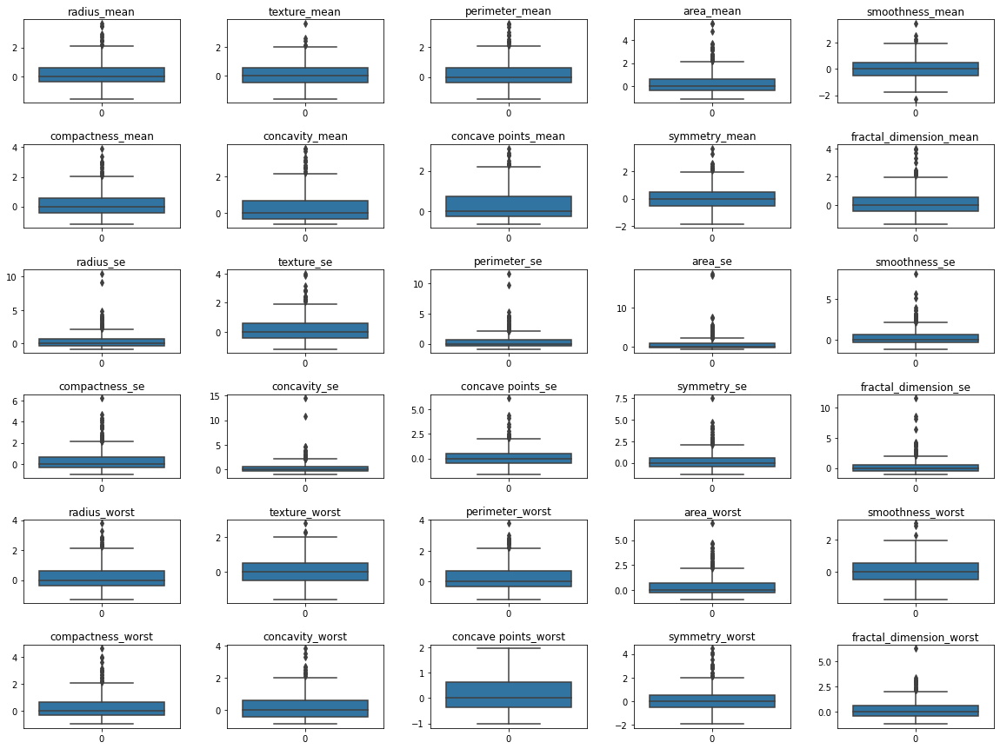

In [23]:
plt.figure(figsize = (20,15))
for i, name in enumerate(namesCut):
    plt.subplot(6,5,i+1)
    sns.boxplot(data=train_RS[name])
    plt.title(name)
    
plt.subplots_adjust(wspace=0.3,hspace=0.5)    
plt.show()

In [24]:
train_RS.describe()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
count,455.000000,455.000000,455.000000,455.000000,455.000000,455.000000,455.000000,455.000000,455.000000,455.000000,...,455.000000,455.000000,455.000000,455.000000,455.000000,455.000000,455.000000,455.000000,455.000000,455.000000
mean,0.207931,0.074536,0.213237,0.311257,-0.000582,0.167883,0.263722,0.292813,0.047974,0.161949,...,0.231002,0.044340,0.237568,0.363856,0.029800,0.227268,0.180483,0.162743,0.106514,0.203574
std,0.898621,0.764086,0.872990,1.015466,0.724034,0.830762,0.793896,0.728259,0.804134,0.829850,...,0.879339,0.708765,0.836838,1.078176,0.773724,0.865152,0.790750,0.680796,0.905164,0.897835
min,-1.566047,-1.643688,-1.473372,-1.125419,-2.290523,-1.184650,-0.626054,-0.629347,-1.866667,-1.365135,...,-1.267504,-1.553241,-1.162076,-0.944377,-1.734797,-0.995224,-0.858316,-1.031589,-1.922669,-1.242896
25%,-0.395291,-0.479857,-0.382923,-0.355168,-0.524081,-0.441419,-0.330229,-0.244002,-0.522963,-0.431684,...,-0.360862,-0.473380,-0.328824,-0.327643,-0.481419,-0.351084,-0.412731,-0.359761,-0.481425,-0.412898
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.604709,0.520143,0.617077,0.644832,0.475919,0.558581,0.669771,0.755998,0.477037,0.568316,...,0.639138,0.526620,0.671176,0.672357,0.518581,0.648916,0.587269,0.640239,0.518575,0.587102
max,3.670384,3.650850,3.580234,5.459777,3.445883,3.932198,3.557440,3.112516,3.682963,4.028269,...,3.779174,2.789352,3.776193,6.688678,3.040541,4.624760,3.815942,1.972437,4.459439,6.291574


In [8]:
#Normalizar
from sklearn.preprocessing import MinMaxScaler 

scaler = MinMaxScaler()

train_RS_N = scaler.fit_transform(train_RS)

train_RS_N = pd.DataFrame(data=train_RS_N, columns = namesCut)

In [50]:
# Test dataset normalizado

names_test = test.columns

test_RS_N = scaler.fit_transform(test_RS)

test_RS_N = pd.DataFrame(data=test_RS_N, columns = names_test)
print(test_RS_N.shape)
test_RS_N.head()

(114, 30)


,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,0.316524,0.225352,0.295562,0.215396,0.196522,0.124280,0.061966,0.138630,0.314320,0.119068,...,0.246422,0.196712,0.230988,0.140606,0.232489,0.088688,0.081015,0.298113,0.112382,0.073896
1,0.151929,0.810499,0.138040,0.092129,0.130418,0.046610,0.000000,0.000000,0.000000,0.101271,...,0.122756,0.744448,0.107385,0.062502,0.155089,0.032956,0.000000,0.000000,0.000000,0.003498
2,0.284422,0.157064,0.276663,0.181742,0.547372,0.353452,0.171793,0.275274,0.427213,0.342161,...,0.243114,0.168157,0.221778,0.131614,0.491452,0.265325,0.239161,0.484398,0.327484,0.302667
3,1.000000,0.302177,1.000000,1.000000,0.647104,0.817246,1.000000,1.000000,0.532383,0.232415,...,1.000000,0.319873,1.000000,0.937968,0.590276,0.675093,0.834865,1.000000,0.418770,0.257980
4,0.132084,0.473752,0.120057,0.077873,0.128117,0.072295,0.000000,0.000000,0.357100,0.195763,...,0.112003,0.354197,0.100956,0.053949,0.208685,0.055053,0.000000,0.000000,0.175868,0.063577


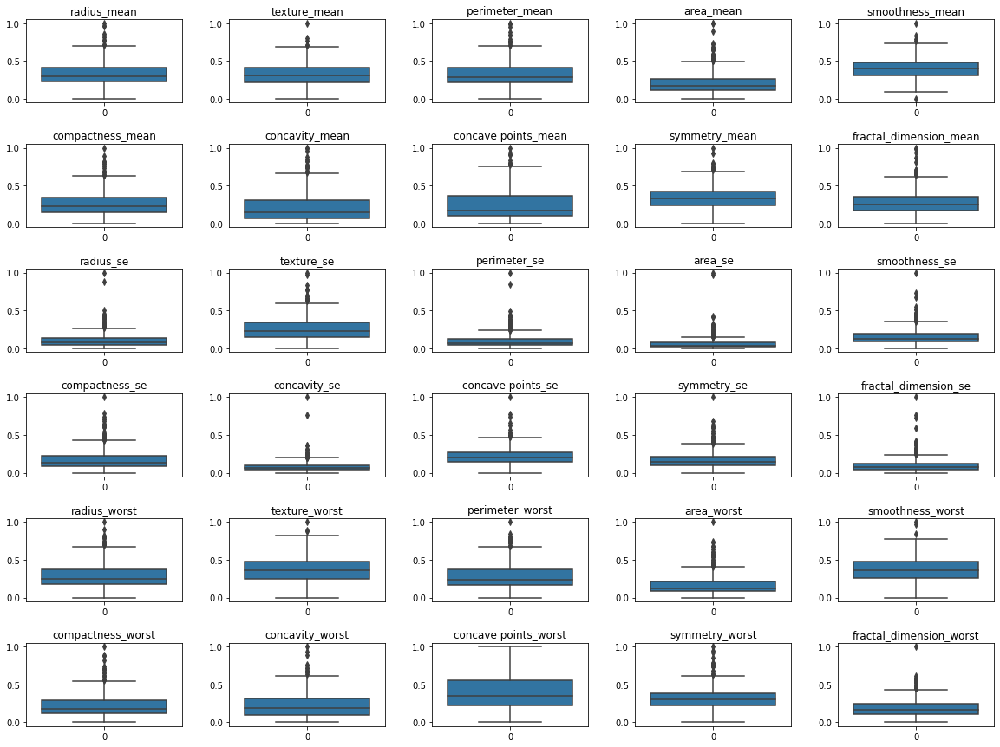

In [30]:
plt.figure(figsize = (20,15))
for i, name in enumerate(namesCut):
    plt.subplot(6,5,i+1)
    sns.boxplot(data=train_RS_N[name])
    plt.title(name)
    
plt.subplots_adjust(wspace=0.3,hspace=0.5)    
plt.show()

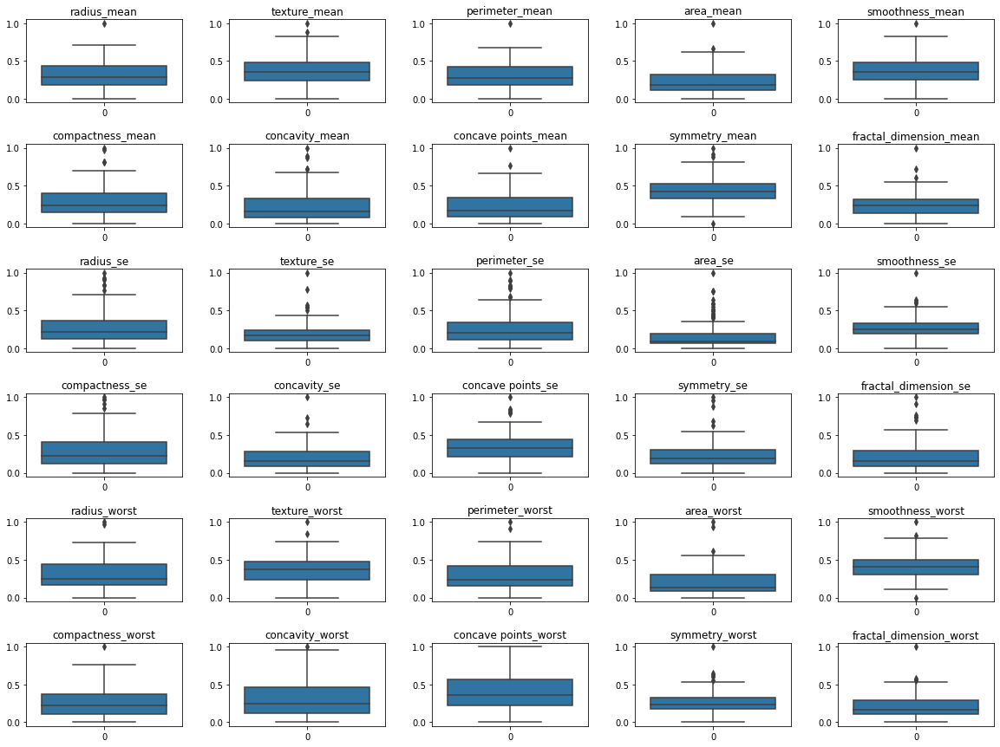

In [51]:
#Boxplots test

plt.figure(figsize = (20,15))
for i, name in enumerate(names_test):
    plt.subplot(6,5,i+1)
    sns.boxplot(data=test_RS_N[name])
    plt.title(name)
    
plt.subplots_adjust(wspace=0.3,hspace=0.5)    
plt.show()

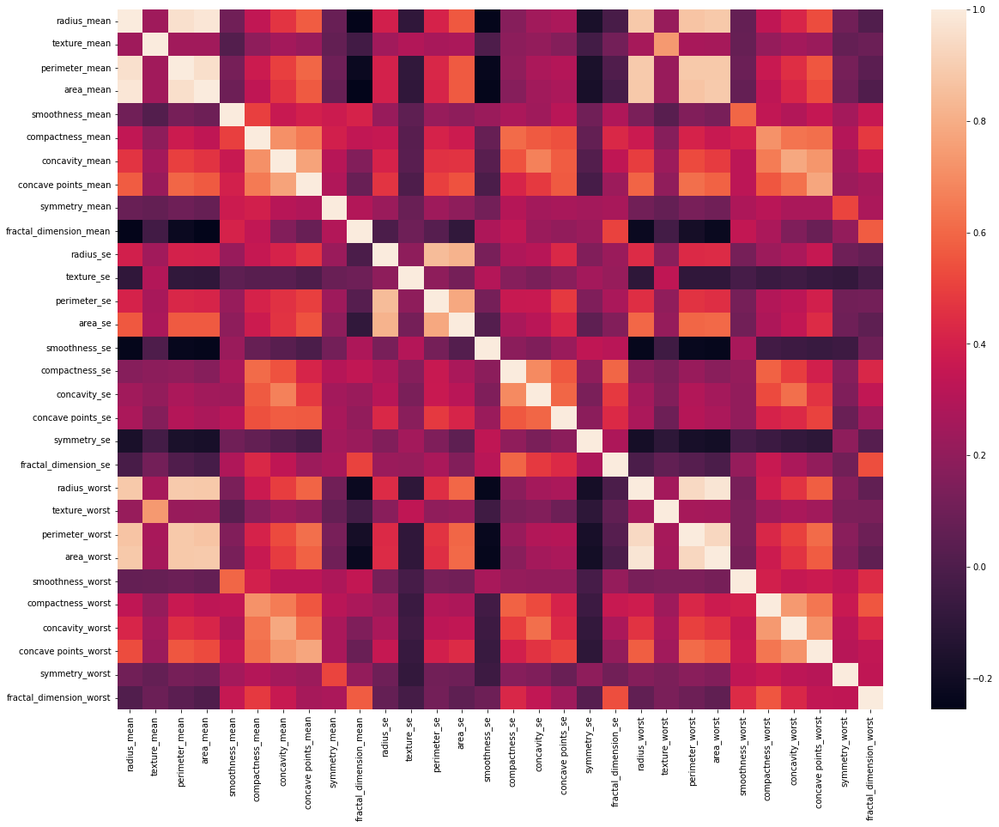

In [32]:
corr2 = train_RS_N.corr(method='kendall')
plt.figure(figsize = (20,15))
sns.heatmap(corr2)
plt.show()

In [14]:
train2 = pd.concat([diagnosis, train_RS_N], axis = 1)
print(train2.shape)
train2.head()

(455, 31)


,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,0,0.176487,0.361177,0.177666,0.085429,0.501670,0.335930,0.197938,0.142495,0.267485,...,0.133760,0.351546,0.129987,0.055348,0.369650,0.215575,0.202396,0.295533,0.247090,0.209694
1,0,0.315159,0.224214,0.300048,0.181676,0.218651,0.126403,0.043510,0.085636,0.099306,...,0.239772,0.297708,0.227452,0.115882,0.195614,0.121014,0.083866,0.295052,0.185555,0.165355
2,0,0.223816,0.252959,0.213461,0.117413,0.407240,0.128918,0.089246,0.160984,0.186332,...,0.180719,0.249733,0.169381,0.082653,0.361160,0.068068,0.121486,0.377663,0.239249,0.104486
3,1,0.393724,0.526209,0.405017,0.249799,0.501670,0.461076,0.394330,0.434940,0.405232,...,0.438990,0.658049,0.492505,0.266368,0.586134,0.563340,0.505990,0.695533,0.584937,0.286764
4,1,0.353495,0.355428,0.350356,0.211750,0.416087,0.310472,0.276476,0.297217,0.418046,...,0.369975,0.482409,0.336122,0.211070,0.523169,0.362691,0.396725,0.631615,0.757425,0.303424


In [38]:
train2.columns

Index(['diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst'],
      dtype='object')

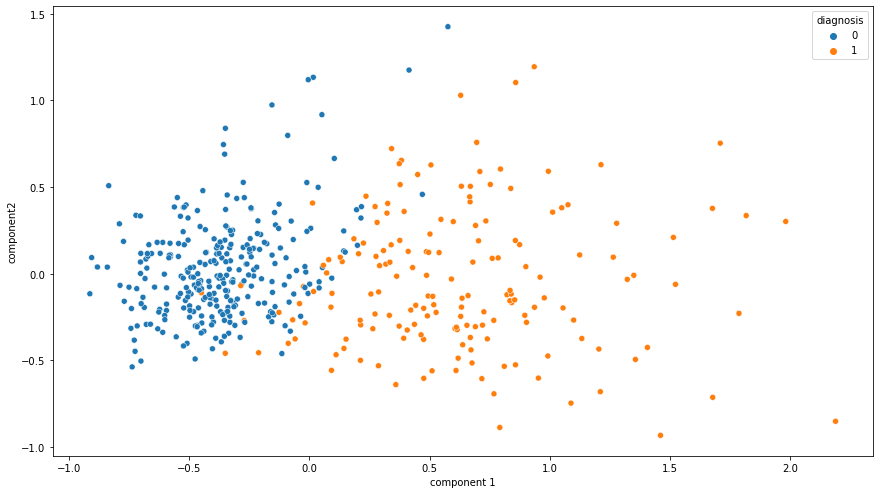

In [39]:
#PCA de datos transformados
from sklearn.decomposition import PCA

pca = PCA(2)
projected = pca.fit_transform(train2.iloc[:,1:])
sns.scatterplot(x=projected[:,0], y = projected[:,1], hue = diagnosis)
plt.xlabel('component 1')
plt.ylabel('component2')
plt.show()

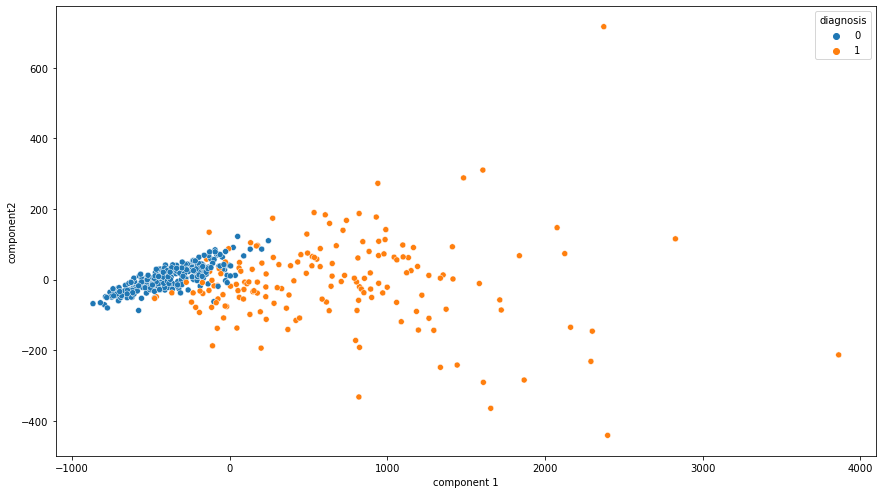

In [40]:
#PCA de datos NO transformados

projectedNT = pca.fit_transform(train.iloc[:,1:])
sns.scatterplot(x=projectedNT[:,0], y = projectedNT[:,1], hue = diagnosis)
plt.xlabel('component 1')
plt.ylabel('component2')
plt.show()

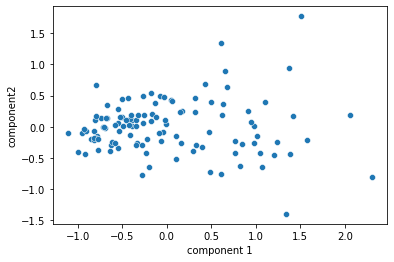

In [52]:
#PCA test
from sklearn.decomposition import PCA

pca = PCA(2)
projectedNT = pca.fit_transform(test_RS_N)
sns.scatterplot(x=projectedNT[:,0], y = projectedNT[:,1])
plt.xlabel('component 1')
plt.ylabel('component2')
plt.show()

# Aplicació de model d'aprenentatge supervisat



## Oversampling transformant les dades previament amb PCA

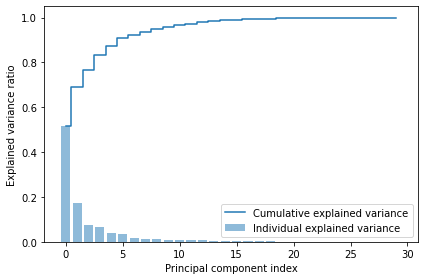

In [15]:
from sklearn.decomposition import PCA

x = train2.drop(['diagnosis'], axis = 1)
y = train2['diagnosis']

pca = PCA()

X_PCA = pca.fit_transform(x)

# Determine explained variance using explained_variance_ration_ attribute
exp_var_pca = pca.explained_variance_ratio_

# Cumulative sum of eigenvalues; This will be used to create step plot
# for visualizing the variance explained by each principal component.
#
cum_sum_eigenvalues = np.cumsum(exp_var_pca)

# Create the visualization plot
#
plt.bar(range(0,len(exp_var_pca)), exp_var_pca, alpha=0.5, align='center', label='Individual explained variance')
plt.step(range(0,len(cum_sum_eigenvalues)), cum_sum_eigenvalues, where='mid',label='Cumulative explained variance')
plt.ylabel('Explained variance ratio')
plt.xlabel('Principal component index')
plt.legend(loc='best')
plt.tight_layout()
plt.show()

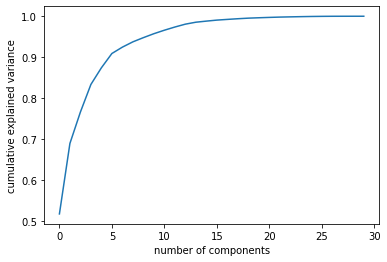

In [15]:
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance');

Miran la gràfica semba que amb 15 principal components tindrem suficient informació

In [16]:
pca = PCA(n_components = 15)
X_PCA = pca.fit_transform(x)
print("original shape:   ", x.shape)
print("transformed shape:", X_PCA.shape)

original shape:    (455, 30)
transformed shape: (455, 15)


In [17]:
#Split the sample

from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(X_PCA,y, test_size=0.25,
                                                    random_state=42,
                                                   stratify = y)

print(x_train.shape)
print(y_train.shape)
print(x_test.shape)
print(y_test.shape)

(341, 15)
(341,)
(114, 15)
(114,)


In [18]:
#sinthetic oversampling
from imblearn.over_sampling import SMOTE

x_res, y_res = SMOTE(random_state=42).fit_resample(x_train, y_train)
y_res.value_counts()

1    214
0    214
Name: diagnosis, dtype: int64

### Machine learning amb dades transformades a PCA


Best params hace referencia al gread search>
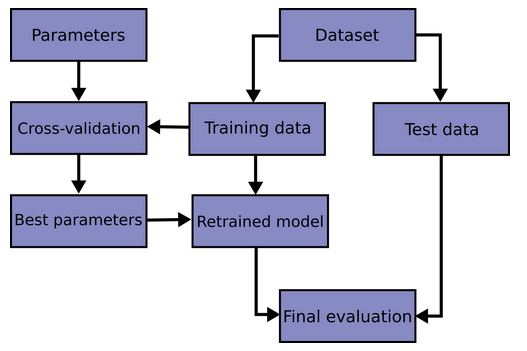

In [19]:
#Logistic Regression
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn.model_selection import GridSearchCV, cross_val_score

steps = [('log_reg',LogisticRegression()),
        ]

make_pipeline = Pipeline(steps)

scores = cross_val_score(LogisticRegression(), x_res, y_res)#

parameters = {'log_reg__solver':['liblinear', 'sag', 'saga']}

grid = GridSearchCV(make_pipeline, param_grid=parameters, cv=5)

grid.fit(x_res, y_res)

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('log_reg', LogisticRegression())]),
             param_grid={'log_reg__solver': ['liblinear', 'sag', 'saga']})

In [20]:
scores.mean()

0.960328317373461

In [21]:
grid.best_params_

{'log_reg__solver': 'liblinear'}

In [22]:
log_predict = grid.predict(x_test)

In [23]:
# Método para obtener todas las métricas del modelo

from sklearn.metrics import accuracy_score, auc, confusion_matrix, f1_score, precision_score, recall_score, roc_curve

def metrics_models(y_true, y_pred):
    from sklearn.metrics import accuracy_score, auc, confusion_matrix, f1_score, precision_score, recall_score, roc_curve

    # Obtención de matriz de confusión
    confusion_matrix = confusion_matrix(y_true, y_pred)

    print("La matriz de confusión es ")
    print(confusion_matrix)

    print('Precisión:', accuracy_score(y_true, y_pred))
    print('Exactitud:', precision_score(y_true, y_pred))
    print('Exhaustividad:', recall_score(y_true, y_pred))
    print('F1:', f1_score(y_true, y_pred))

    false_positive_rate, recall, thresholds = roc_curve(y_true, y_pred)
    roc_auc = auc(false_positive_rate, recall)

    print('AUC:', auc(false_positive_rate, recall))

    plt.plot(false_positive_rate, recall, 'b')
    plt.plot([0, 1], [0, 1], 'r--')
    plt.title('AUC = %0.2f' % roc_auc)

La matriz de confusión es 
[[71  0]
 [ 1 42]]
Precisión: 0.9912280701754386
Exactitud: 1.0
Exhaustividad: 0.9767441860465116
F1: 0.988235294117647
AUC: 0.9883720930232558


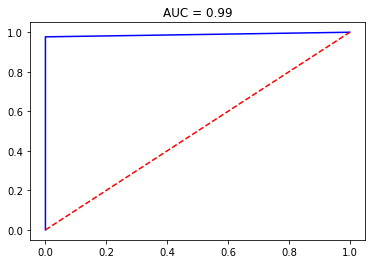

In [24]:
metrics_models(y_test,log_predict)

## Obtencion pronóstico con logistical regresion 



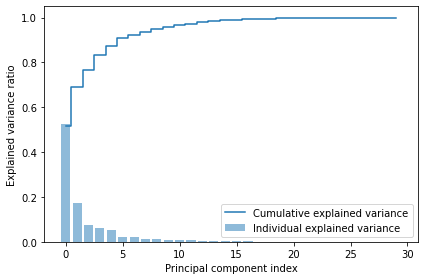

In [53]:
#Reducir dimenensiones test

pca = PCA()

X_PCA = pca.fit_transform(test_RS_N)

# Determine explained variance using explained_variance_ration_ attribute
exp_var_pca_test = pca.explained_variance_ratio_

# Cumulative sum of eigenvalues; This will be used to create step plot
# for visualizing the variance explained by each principal component.
#
cum_sum_eigenvalues_test = np.cumsum(exp_var_pca)

# Create the visualization plot
#
plt.bar(range(0,len(exp_var_pca_test)), exp_var_pca_test, alpha=0.5, align='center', label='Individual explained variance')
plt.step(range(0,len(cum_sum_eigenvalues_test)), cum_sum_eigenvalues_test, where='mid',label='Cumulative explained variance')
plt.ylabel('Explained variance ratio')
plt.xlabel('Principal component index')
plt.legend(loc='best')
plt.tight_layout()
plt.show()

In [59]:
pca = PCA(n_components = 15)
X_PCA_test = pca.fit_transform(test_RS_N)
print("original shape:   ", test_RS_N.shape)
print("transformed shape:", X_PCA_test.shape)

original shape:    (114, 30)
transformed shape: (114, 15)


In [63]:
#ontenemos los valores predichos de la parta evaluativa de la hackaton
test_predict = grid.predict(X_PCA_test)

In [56]:
type(test_predict)

numpy.ndarray

In [64]:
predictions = pd.DataFrame(data=test_predict, columns = ['predictions'])


In [65]:
predictions.head()

,predictions
0,0
1,0
2,0
3,1
4,0


In [66]:
predictions.shape

(114, 1)

In [62]:
X_PCA_test.shape

(114, 15)

In [44]:
test_RS_N.shape

(455, 30)

In [45]:
test.shape

(114, 30)

In [67]:
predictions_csv = predictions.to_csv('predictions.csv')

## Evaluación del modelo en train con SVC()

La matriz de confusión es 
[[71  0]
 [ 1 42]]
Precisión: 0.9912280701754386
Exactitud: 1.0
Exhaustividad: 0.9767441860465116
F1: 0.988235294117647
AUC: 0.9883720930232558


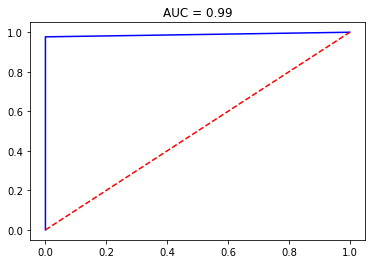

In [30]:
from sklearn.pipeline import Pipeline
from sklearn.svm import SVC
from sklearn import metrics
from sklearn.model_selection import GridSearchCV, cross_val_score

steps = [ ('SVM', SVC())]

make_pipelineSVC = Pipeline(steps)

scores_SVC = cross_val_score(SVC(), x_res, y_res)#

parameters = {'SVM__C':[0.001,0.1,10,100,10e5], 'SVM__gamma':[0.1,0.01]}

grid_SVC = GridSearchCV(make_pipelineSVC, param_grid=parameters, cv=5)

grid_SVC.fit(x_res, y_res)

SVCpredict = grid_SVC.predict(x_test)

metrics_models(y_test,SVCpredict)

In [31]:
scores_SVC.mean()

0.9720656634746921

## Oversampling sin PCA

In [51]:
from sklearn.model_selection import train_test_split

x = train2.drop(['diagnosis'], axis = 1)
y = train2['diagnosis']

x_train, x_test, y_train, y_test = train_test_split(x,y, test_size=0.3,
                                                    random_state=42,
                                                   stratify = y)

print(x_train.shape)
print(y_train.shape)
print(x_test.shape)
print(y_test.shape)

(318, 30)
(318,)
(137, 30)
(137,)


In [55]:
from imblearn.over_sampling import SMOTE

x_res, y_res = SMOTE(random_state=42).fit_resample(x_train, y_train)
y_res.value_counts()

1    199
0    199
Name: diagnosis, dtype: int64